# Starfysh tutorial for sample integration

**Azizi Lab**

Siyu He, Yinuo Jin

05-13-2024

This tutorial provides an example of using Starfysh to characterize common *spatial hubs* through integrative spatial deconvolution from multiple samples. The datasets here include 12 distinct breast tumor samples with heterogeneous disease states.

In [1]:
import sys
IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    !pip3 install scanpy
    from google.colab import drive
    drive.mount('/content/drive')
    import sys
    sys.path.append('/content/drive/MyDrive/SpatialModelProject/model_test_colab/')

In [2]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import torch

In [3]:
import matplotlib.pyplot as plt
import matplotlib.font_manager
from matplotlib import rcParams

font_list = []
fpaths = matplotlib.font_manager.findSystemFonts()
for i in fpaths:
    try:
        f = matplotlib.font_manager.get_font(i)
        font_list.append(f.family_name)
    except RuntimeError:
        pass

font_list = set(font_list)
plot_font = 'Helvetica' if 'Helvetica' in font_list else 'FreeSans'

rcParams['font.family'] = plot_font
rcParams.update({'font.size': 10})
rcParams.update({'figure.dpi': 300})
rcParams.update({'figure.figsize': (3,3)})
rcParams.update({'savefig.dpi': 500})

import warnings
warnings.filterwarnings('ignore')

## Load Starfysh

In [4]:
from starfysh import (AA, utils, plot_utils, post_analysis, utils_integrate)
from starfysh import starfysh as sf_model

### (1), load datasets & marker genes

File input:

- Spatial transcriptomics
    - Count matrices: list of `adata`s
    - (Optional): list of paired histology & spot coordinates corresponding to count matrices
- Annotated signatures (marker genes) for potential cell types: `gene_sig`

Starfysh is built upon scanpy and Anndata. The common ST/Visium data sample folder consists a expression count file (usually `filtered_feature_bc_matrix.h5`), and a subdirectory with corresponding H&E image and spatial information, as provided by Visium platform.

For ST data that doesn't follow the consensus data struction (e.g. missing `filtered_feature_bc_matrix.h5`), please ensure that a `.h5ad` count matrix exists in the data directory.

Example directory structure:

```
├── ../data
    signature.csv

    ├── CID44971_TNBC:
        \__ CID44971_TNBC.h5ad

        ├── (Optional) spatial:
            \__ scalefactors_json.json
                tissue_hires_image.png
                tissue_positions_list.csv
                ...
    .
    .
    .
    
    ├── P4A_MBC:
        \__ filtered_feature_bc_matrix.h5

        ├── (Optional) spatial:
            \__ scalefactors_json.json
                tissue_hires_image.png
                tissue_positions_list.csv
                ...        
```

Create meta info. for samples

In [5]:
# Configs 
meta_info = [['P1A_ER','P1_ER','ER'],
             ['P1B_ER','P1_ER','ER'],
             ['P2A_TNBC','P2_TNBC','TNBC'],
             ['P2B_TNBC','P2_TNBC','TNBC'],
             ['P3A_MBC','P3_MBC','MBC',],
             ['P3B_MBC','P3_MBC','MBC',],
             ['P4A_MBC','P4_MBC','MBC',],
             ['P4B_MBC','P4_MBC','MBC',],
             ['CID4465_TNBC','CID4465_TNBC','TNBC'],
             ['CID44971_TNBC','CID44971_TNBC','TNBC'],
             ['1142243F_TNBC','1142243F_TNBC','TNBC'],
             ['1160920F_TNBC','1160920F_TNBC','TNBC'],
            ]

meta_info = pd.DataFrame(meta_info,columns=['sample','patient','tissue_type'])
data_path = '../data/'
sig_file_name = 'bc_signatures_version_1013.csv' 


# Load data
adata_all = []
adata_normed_all = []
img_metadata_all = {}
for sample_id in meta_info['sample']:
    print(sample_id)
    adata, adata_normed = utils.load_adata(data_folder=data_path,  # root data directory
                                           sample_id=sample_id,  # sample_id
                                           n_genes=2000  # number of highly variable genes to keep
                                          )
    
    
    adata_all.append(adata)
    adata_normed_all.append(adata_normed)
    
    img_metadata = utils.preprocess_img(data_path,
                                    sample_id,
                                    adata_index=adata.obs.index,
                                    hchannel=True
                                    )
    
    adata.obs['patient']=meta_info['patient'][list(meta_info['sample']).index(sample_id)]
    adata.obs['sample_type']=meta_info['tissue_type'][list(meta_info['sample']).index(sample_id)]
    adata.obs_names  = adata.obs_names+'-'+sample_id

    adata_normed.obs['patient']=adata.obs['patient']
    adata_normed.obs['sample_type']=adata.obs['sample_type']

    img_metadata['map_info'].index = img_metadata['map_info'].index+'-'+sample_id
    img_metadata_all[sample_id] = img_metadata 
    

# Save concat data
adata_all = anndata.concat(adata_all)
adata_normed_all = anndata.concat(adata_normed_all)

sc.pp.highly_variable_genes(adata_normed_all)
adata_all.uns = adata_normed_all.uns
adata_all.var = adata_normed_all.var

adata_all.write(os.path.join(data_path, 'adata_integrate.h5ad'))
adata_normed_all.write(os.path.join(data_path, 'adata_normed_integrate.h5ad'))


P1A_ER


[2023-10-24 06:02:46] Preprocessing1: delete the mt and rp
[2023-10-24 06:02:46] Preprocessing2: Normalize
[2023-10-24 06:02:46] Preprocessing3: Logarithm
[2023-10-24 06:02:46] Preprocessing4: Find the variable genes


P1B_ER


[2023-10-24 06:02:48] Preprocessing1: delete the mt and rp
[2023-10-24 06:02:48] Preprocessing2: Normalize
[2023-10-24 06:02:48] Preprocessing3: Logarithm
[2023-10-24 06:02:48] Preprocessing4: Find the variable genes


P2A_TNBC


[2023-10-24 06:02:50] Preprocessing1: delete the mt and rp
[2023-10-24 06:02:50] Preprocessing2: Normalize
[2023-10-24 06:02:50] Preprocessing3: Logarithm
[2023-10-24 06:02:50] Preprocessing4: Find the variable genes


P2B_TNBC


[2023-10-24 06:02:52] Preprocessing1: delete the mt and rp
[2023-10-24 06:02:53] Preprocessing2: Normalize
[2023-10-24 06:02:53] Preprocessing3: Logarithm
[2023-10-24 06:02:53] Preprocessing4: Find the variable genes


P3A_MBC


[2023-10-24 06:02:54] Preprocessing1: delete the mt and rp
[2023-10-24 06:02:55] Preprocessing2: Normalize
[2023-10-24 06:02:55] Preprocessing3: Logarithm
[2023-10-24 06:02:55] Preprocessing4: Find the variable genes


P3B_MBC


[2023-10-24 06:02:56] Preprocessing1: delete the mt and rp
[2023-10-24 06:02:56] Preprocessing2: Normalize
[2023-10-24 06:02:56] Preprocessing3: Logarithm
[2023-10-24 06:02:56] Preprocessing4: Find the variable genes


P4A_MBC


[2023-10-24 06:02:57] Preprocessing1: delete the mt and rp
[2023-10-24 06:02:57] Preprocessing2: Normalize
[2023-10-24 06:02:57] Preprocessing3: Logarithm
[2023-10-24 06:02:57] Preprocessing4: Find the variable genes


P4B_MBC


[2023-10-24 06:02:58] Preprocessing1: delete the mt and rp
[2023-10-24 06:02:58] Preprocessing2: Normalize
[2023-10-24 06:02:58] Preprocessing3: Logarithm
[2023-10-24 06:02:58] Preprocessing4: Find the variable genes


CID4465_TNBC


[2023-10-24 06:03:00] Preprocessing1: delete the mt and rp
[2023-10-24 06:03:00] Preprocessing2: Normalize
[2023-10-24 06:03:00] Preprocessing3: Logarithm
[2023-10-24 06:03:00] Preprocessing4: Find the variable genes


CID44971_TNBC


[2023-10-24 06:03:01] Preprocessing1: delete the mt and rp
[2023-10-24 06:03:01] Preprocessing2: Normalize
[2023-10-24 06:03:01] Preprocessing3: Logarithm
[2023-10-24 06:03:01] Preprocessing4: Find the variable genes


1142243F_TNBC


[2023-10-24 06:03:03] Preprocessing1: delete the mt and rp
[2023-10-24 06:03:04] Preprocessing2: Normalize
[2023-10-24 06:03:04] Preprocessing3: Logarithm
[2023-10-24 06:03:04] Preprocessing4: Find the variable genes


1160920F_TNBC


[2023-10-24 06:03:06] Preprocessing1: delete the mt and rp
[2023-10-24 06:03:07] Preprocessing2: Normalize
[2023-10-24 06:03:07] Preprocessing3: Logarithm
[2023-10-24 06:03:07] Preprocessing4: Find the variable genes
... storing 'sample' as categorical
... storing 'patient' as categorical
... storing 'sample_type' as categorical
... storing 'sample' as categorical
... storing 'patient' as categorical
... storing 'sample_type' as categorical


In [6]:
# Load signatures
gene_sig = pd.read_csv(os.path.join(data_path, sig_file_name))
gene_sig = utils.filter_gene_sig(gene_sig, adata_all.to_df())
gene_sig.head()

,Basal,LumA,LumB,MBC,Normal epithelial,Tcm,Tem,Tfh,Treg,Activated CD8,...,Plasmablasts,MDSC,Monocytes,cDC,pDC,CAFs MSC iCAF-like,CAFs myCAF-like,PVL differentiated,PVL immature,Endothelial
0,EMP1,SH3BGRL,UGCG,COL11A2,KRT14,CCR7,IL7R,CXCL13,TNFRSF4,CD69,...,IGKV3-15,ITGAM,LYZ,CD80,IL3RA,APOD,COL1A1,ACTA2,CCL19,ACKR1
1,TAGLN,HSPB1,ARMT1,SDC1,KRT17,LTB,ANXA1,NMB,LTB,CCR7,...,IGHG1,CD33,IL1B,CD86,LILRA4,DCN,COL1A2,TAGLN,RGS5,FABP4
2,TTYH1,PHGR1,ISOC1,FBN2,LTF,IL7R,CXCR4,NR3C1,IL32,CD27,...,IGKV1-5,ARG1,G0S2,CCR7,CD123,PTGDS,COL3A1,MYL9,IGFBP7,PLVAP
3,RTN4,SOX9,GDF15,MMP1,KRT15,SARAF,KLRB1,DUSP4,BATF,BTLA,...,IGKV3-20,NOS2,TYROBP,CD1A,TCF4,CFD,LUM,TPM2,NDUFA4L2,RAMP2
4,TK1,CEBPD,ZFP36,FABP5,PTN,SELL,TNFAIP3,TNFRSF18,FOXP3,CD40LG,...,IGKV3-11,CD68,FCN1,CD1C,IRF7,LUM,SFRP2,NDUFA4L2,CCL2,VWF


### (2). Preprocessing

Starfysh calcualates cell-type proportion scores for each spot per sample given the annotated signatures (per cell type) as the model's prior

Each spot will be ranked (`anchors_df`) based on the prior, which represents the rough estimation of the given cell-type's enrichment

**Note**: we don't recommend apply archetypal analysis (AA) on the concatenated raw expressions across samples (`adata_all`), as batch effects might dominate geometric extrema as opposed to real cell state differences. For usage of AA on individual samples, please refer to tutorials `Starfysh_tutorial_real.ipynb` & `Starfysh_tutorialk_real_wo_signatures`. 

In [ ]:
# Load saved concat data
adata_all = sc.read_h5ad(os.path.join(data_path, 'adata_integrate.h5ad'))
adata_normed_all = sc.read_h5ad(os.path.join(data_path, 'adata_normed_integrate.h5ad'))

In [7]:
indiv_args_dict = {}

for sample_id in meta_info['sample']:
    print(sample_id)
    adata = adata_all[adata_all.obs['sample']==sample_id]
    adata_normed = adata_normed_all[adata_normed_all.obs['sample']==sample_id]
    
    sc.pp.highly_variable_genes(adata_normed)
    adata.uns = adata_normed.uns
    adata.var = adata_normed.var
    img_metadata = img_metadata_all[sample_id]
    
    args = utils.VisiumArguments(adata,
                                 adata_normed,
                                 gene_sig,
                                 img_metadata,
                                 window_size=1,
                                 sample_id=sample_id,
                                 n_img_chan=1
                                )
    
    indiv_args_dict[sample_id] = args


sc.pp.highly_variable_genes(adata_normed_all)
adata_all.uns = adata_normed_all.uns
adata_all.var = adata_normed_all.var

integrated_args = utils_integrate.VisiumArguments_integrate(adata_all,
                                                            adata_normed_all,
                                                            gene_sig,
                                                            img_metadata_all,
                                                            indiv_args_dict,                                        
                                                            window_size=1,
                                                            sample_id=meta_info['sample']
                                                           )

P1A_ER


[2023-10-24 06:03:16] Subsetting highly variable & signature genes ...


[2023-10-24 06:03:28] Smoothing library size by taking averaging with neighbor spots...
[2023-10-24 06:03:29] Retrieving & normalizing signature gene expressions...


[2023-10-24 06:03:31] Identifying anchor spots (highly expression of specific cell-type signatures)...


P1B_ER


[2023-10-24 06:03:32] Subsetting highly variable & signature genes ...
[2023-10-24 06:03:42] Smoothing library size by taking averaging with neighbor spots...
[2023-10-24 06:03:43] Retrieving & normalizing signature gene expressions...


[2023-10-24 06:03:46] Identifying anchor spots (highly expression of specific cell-type signatures)...


P2A_TNBC


[2023-10-24 06:03:47] Subsetting highly variable & signature genes ...
[2023-10-24 06:04:07] Smoothing library size by taking averaging with neighbor spots...
[2023-10-24 06:04:08] Retrieving & normalizing signature gene expressions...


[2023-10-24 06:04:11] Identifying anchor spots (highly expression of specific cell-type signatures)...


P2B_TNBC


[2023-10-24 06:04:13] Subsetting highly variable & signature genes ...
[2023-10-24 06:04:32] Smoothing library size by taking averaging with neighbor spots...
[2023-10-24 06:04:33] Retrieving & normalizing signature gene expressions...


[2023-10-24 06:04:37] Identifying anchor spots (highly expression of specific cell-type signatures)...


P3A_MBC


[2023-10-24 06:04:38] Subsetting highly variable & signature genes ...
[2023-10-24 06:04:44] Smoothing library size by taking averaging with neighbor spots...
[2023-10-24 06:04:45] Retrieving & normalizing signature gene expressions...


[2023-10-24 06:04:47] Identifying anchor spots (highly expression of specific cell-type signatures)...


P3B_MBC


[2023-10-24 06:04:48] Subsetting highly variable & signature genes ...
[2023-10-24 06:04:53] Smoothing library size by taking averaging with neighbor spots...
[2023-10-24 06:04:54] Retrieving & normalizing signature gene expressions...


[2023-10-24 06:04:56] Identifying anchor spots (highly expression of specific cell-type signatures)...


P4A_MBC


[2023-10-24 06:04:57] Subsetting highly variable & signature genes ...
[2023-10-24 06:05:06] Smoothing library size by taking averaging with neighbor spots...
[2023-10-24 06:05:08] Retrieving & normalizing signature gene expressions...


[2023-10-24 06:05:11] Identifying anchor spots (highly expression of specific cell-type signatures)...


P4B_MBC


[2023-10-24 06:05:12] Subsetting highly variable & signature genes ...
[2023-10-24 06:05:20] Smoothing library size by taking averaging with neighbor spots...
[2023-10-24 06:05:22] Retrieving & normalizing signature gene expressions...


[2023-10-24 06:05:25] Identifying anchor spots (highly expression of specific cell-type signatures)...


CID4465_TNBC


[2023-10-24 06:05:26] Subsetting highly variable & signature genes ...
[2023-10-24 06:05:31] Smoothing library size by taking averaging with neighbor spots...
[2023-10-24 06:05:32] Retrieving & normalizing signature gene expressions...


[2023-10-24 06:05:34] Identifying anchor spots (highly expression of specific cell-type signatures)...


CID44971_TNBC


[2023-10-24 06:05:34] Subsetting highly variable & signature genes ...
[2023-10-24 06:05:39] Smoothing library size by taking averaging with neighbor spots...
[2023-10-24 06:05:39] Retrieving & normalizing signature gene expressions...


[2023-10-24 06:05:41] Identifying anchor spots (highly expression of specific cell-type signatures)...


1142243F_TNBC


[2023-10-24 06:05:42] Subsetting highly variable & signature genes ...
[2023-10-24 06:06:02] Smoothing library size by taking averaging with neighbor spots...
[2023-10-24 06:06:04] Retrieving & normalizing signature gene expressions...


[2023-10-24 06:06:09] Identifying anchor spots (highly expression of specific cell-type signatures)...


1160920F_TNBC


[2023-10-24 06:06:11] Subsetting highly variable & signature genes ...
[2023-10-24 06:06:38] Smoothing library size by taking averaging with neighbor spots...
[2023-10-24 06:06:40] Retrieving & normalizing signature gene expressions...


[2023-10-24 06:06:45] Identifying anchor spots (highly expression of specific cell-type signatures)...
[2023-10-24 06:06:50] Subsetting highly variable & signature genes ...
[2023-10-24 06:06:51] Smoothing library size by taking averaging with neighbor spots...
[2023-10-24 06:07:05] Retrieving & normalizing signature gene expressions...
[2023-10-24 06:07:05] Identifying anchor spots (highly expression of specific cell-type signatures)...


## Run Starfysh for joint spatial deconvolution & sample integration

### (1). Model parameters

In [8]:
n_repeats = 1
epochs = 100
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


### (2). Model training

In [ ]:
model, loss = utils_integrate.run_starfysh(integrated_args,
                                           n_repeats=n_repeats,
                                           epochs=epochs,
                                           poe=True,
                                           device=device
                                          )

In [ ]:
# Save model
torch.save(model.state_dict(), os.path.join(data_path, 'integ_model.pt'))

### (3). Downstream analysis

#### Parse Starfysh inference output

For image integration without histology integration (`utils_integrate.run_starfysh(..., PoE=False)`):
```Python
model = sf_model.AVAE(
    adata=integrated_args.adata,
    gene_sig=integrated_args.sig_mean_norm,
    patch_r=integrated_args.params['patch_r'],
    win_loglib=1,
    alpha_mul=50
)

model = model.to(device)
model.load_state_dict(torch.load(os.path.join(data_path, 'integ_model.pt')))
```

For image integration with histology integration (`utils_integrate.run_starfysh(..., PoE=True)`):


In [9]:
# Load saved model
model = sf_model.AVAE_PoE(
    adata=integrated_args.adata,
    gene_sig=integrated_args.sig_mean_norm,
    patch_r=integrated_args.params['patch_r'],
    win_loglib=1,
    alpha_mul=50
)

model = model.to(device)
model.load_state_dict(torch.load(os.path.join(data_path, 'integ_model.pt')))

# If running this snippet to load saved model parameters, 
# need to update image patches to compute inference outputs
from starfysh.dataloader import IntegrativePoEDataset
trainset = IntegrativePoEDataset(adata=integrated_args.adata, args=integrated_args)
integrated_args._update_img_patches(trainset)


In [10]:
torch.cuda.empty_cache()

In [11]:
inference_outputs, generative_outputs = sf_model.model_eval_integrate(model,
                                                                      integrated_args.adata,
                                                                      integrated_args,
                                                                      poe=True,
                                                                      device=device
                                                                     )

rv: px_r_poe can't be stored


#### Visualize learnt joint embeddings

Compare UMAPs before & after sample integration

In [38]:
adata_integrate = integrated_args.adata.copy()
adata_integrate.shape

(33958, 4555)

In [40]:
# Before integration
adata_all = adata_all[:, adata_integrate.var_names]
sc.pp.neighbors(adata_all, use_rep='X', n_neighbors=20)
sc.tl.umap(adata_all, min_dist=0.2)

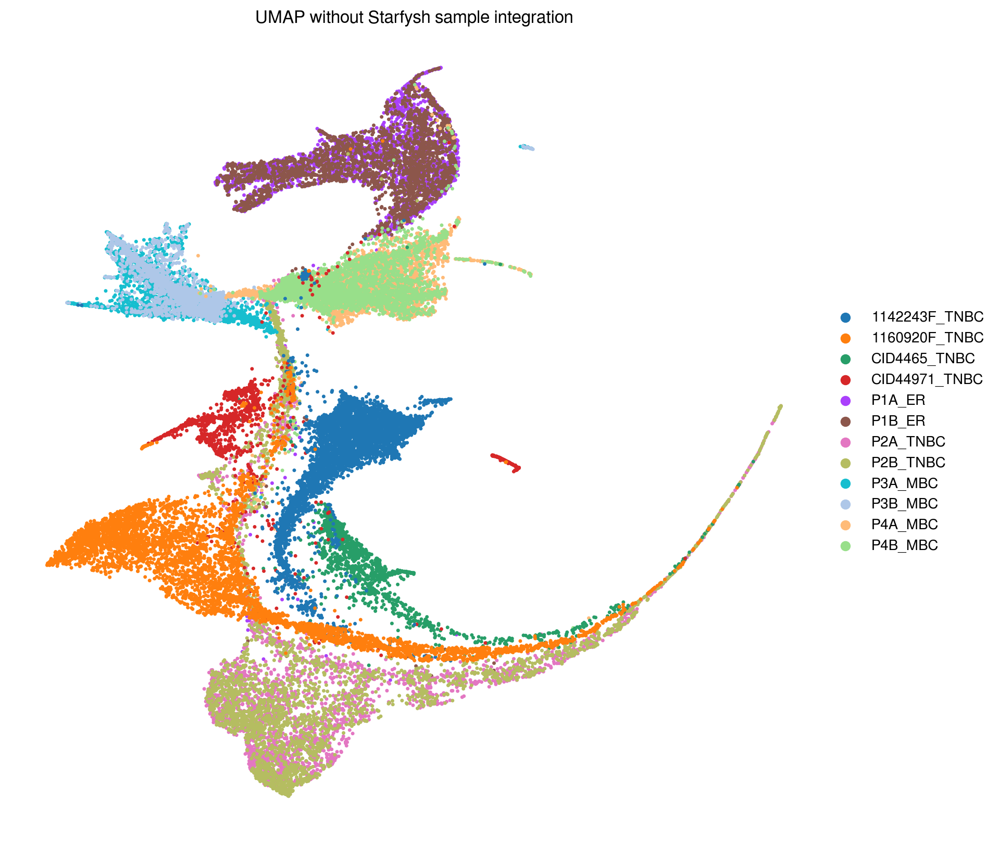

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10), dpi=200)
ax = sc.pl.umap(adata_all, color='sample', 
               frameon=False, s=25, ax=ax,
               title='UMAP without Starfysh sample integration'
              )

In [27]:
# After integration
adata_integrate.obs[gene_sig.columns]=pd.DataFrame(adata_integrate.obsm['qc_m'],
                                                   columns=gene_sig.columns,
                                                   index=adata_integrate.obs_names)
sc.pp.neighbors(adata_integrate, use_rep='qc_m', n_neighbors=20)
sc.tl.umap(adata_integrate,  min_dist=0.2)

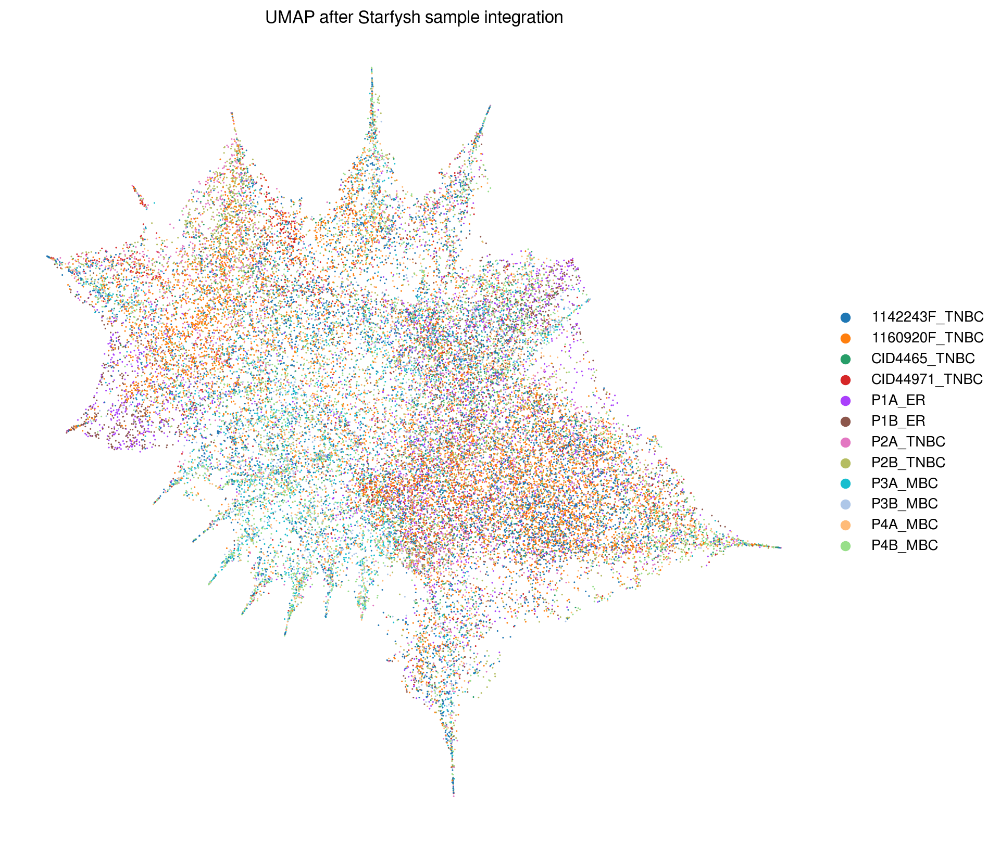

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(10,10), dpi=200)
ax = sc.pl.umap(adata_integrate,color='sample',
                frameon=False, s=5, ax=ax,
                title='UMAP after Starfysh sample integration'
                )

plt.show()

It's observed that Starfysh's integration through learnt `qc` embedding space corrected for batch-effects introduced by different samples / tumor subtypes via joint deconvolution

#### Display deconvolution profiles


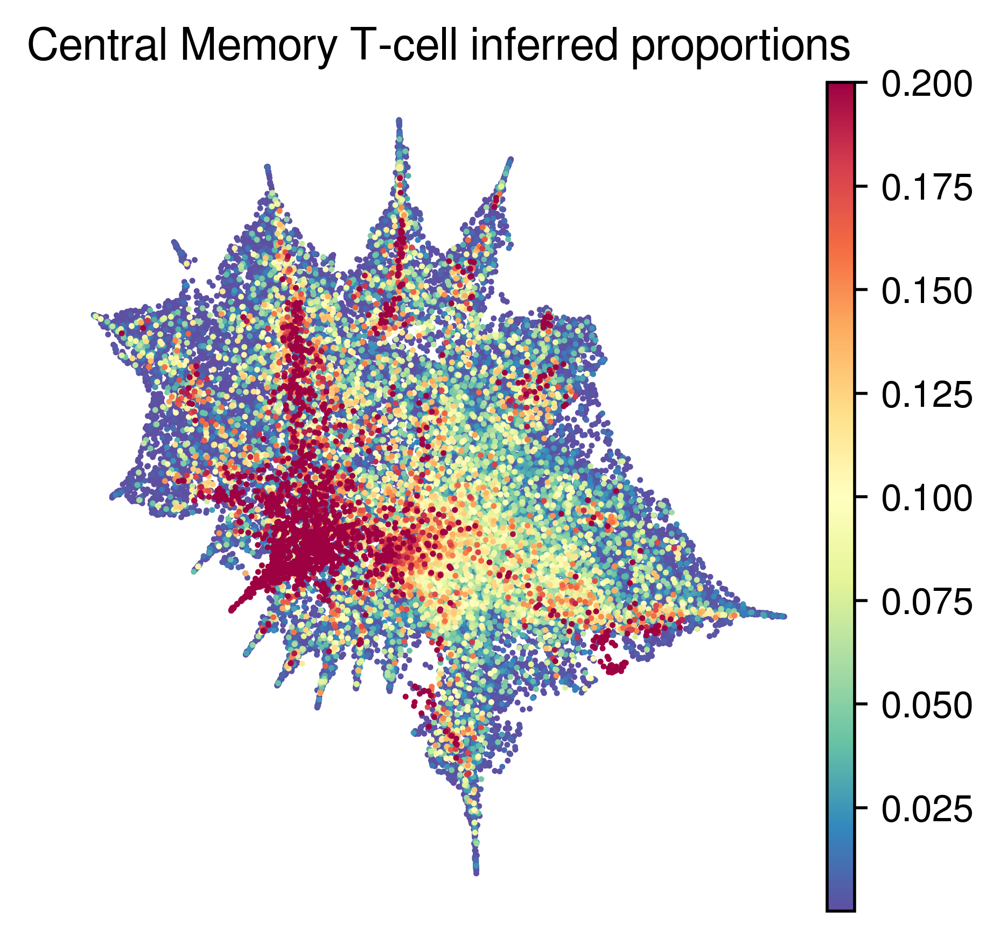

In [52]:
fig, ax = plt.subplots(1, 1,figsize=(4, 4), dpi=500)
sc.pl.umap(adata_integrate, color='Tcm',  
           frameon=False, vmax=0.2,
           s=10, cmap='Spectral_r', ax=ax,
           title='Central Memory T-cell inferred proportions'
          )
plt.show()

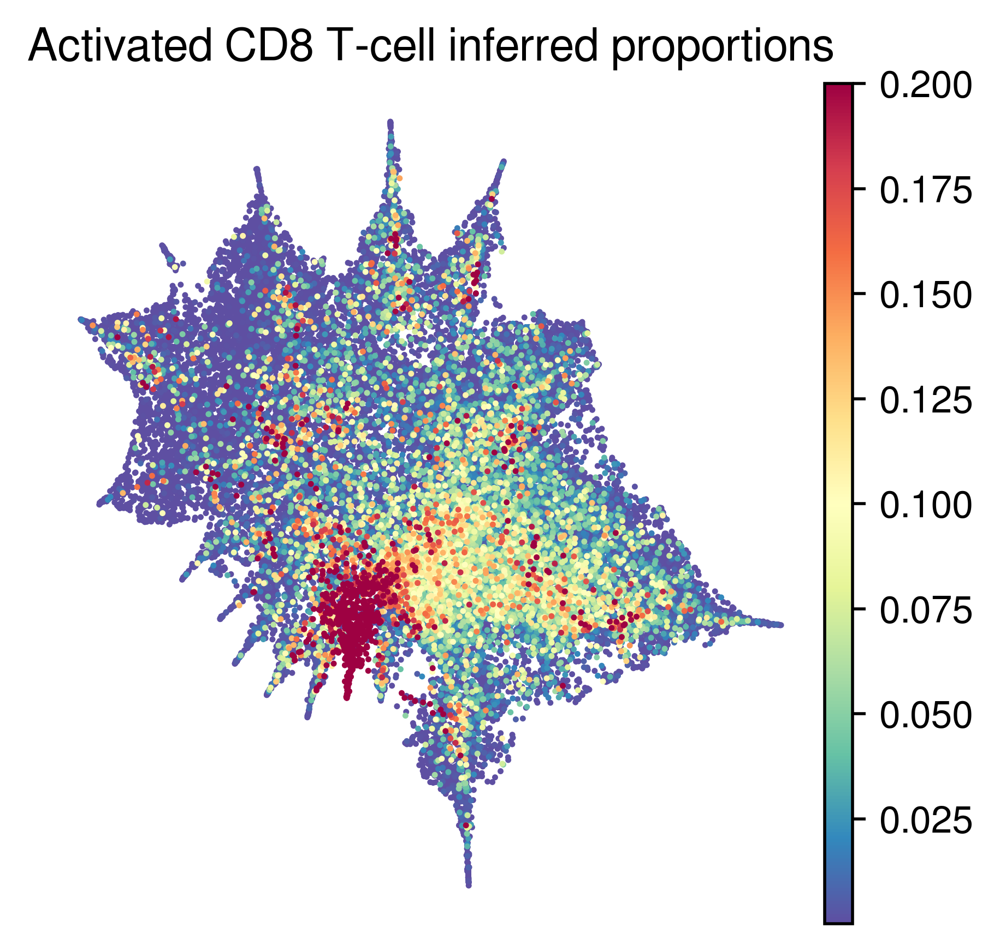

In [53]:
fig, ax = plt.subplots(1, 1,figsize=(4, 4), dpi=500)
sc.pl.umap(adata_integrate, color='Activated CD8',  
           frameon=False, vmax=0.2,
           s=10, cmap='Spectral_r', ax=ax,
           title='Activated CD8 T-cell inferred proportions'
          )
plt.show()

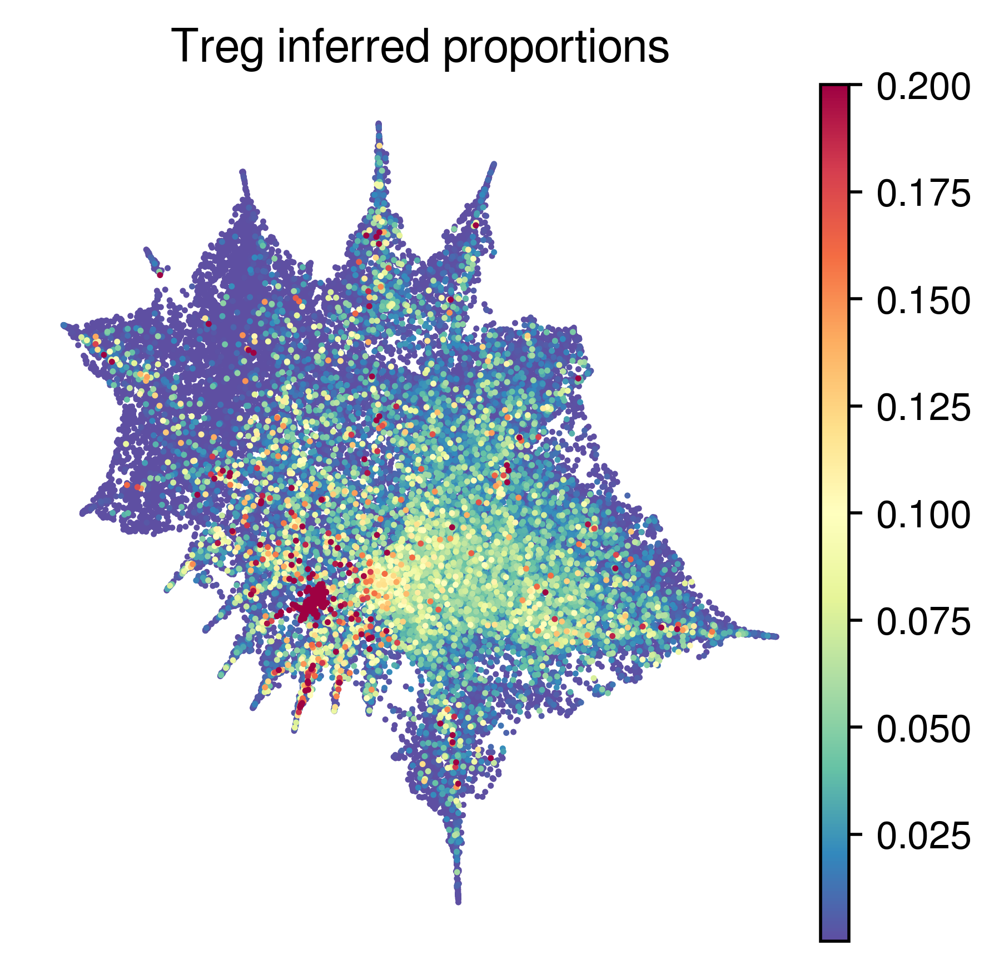

In [48]:
fig, ax = plt.subplots(1, 1,figsize=(4, 4), dpi=500)
sc.pl.umap(adata_integrate, color='Treg',  
           frameon=False, vmax=0.2,
           s=10, cmap='Spectral_r', ax=ax,
           title='Treg inferred proportions'
          )
plt.show()

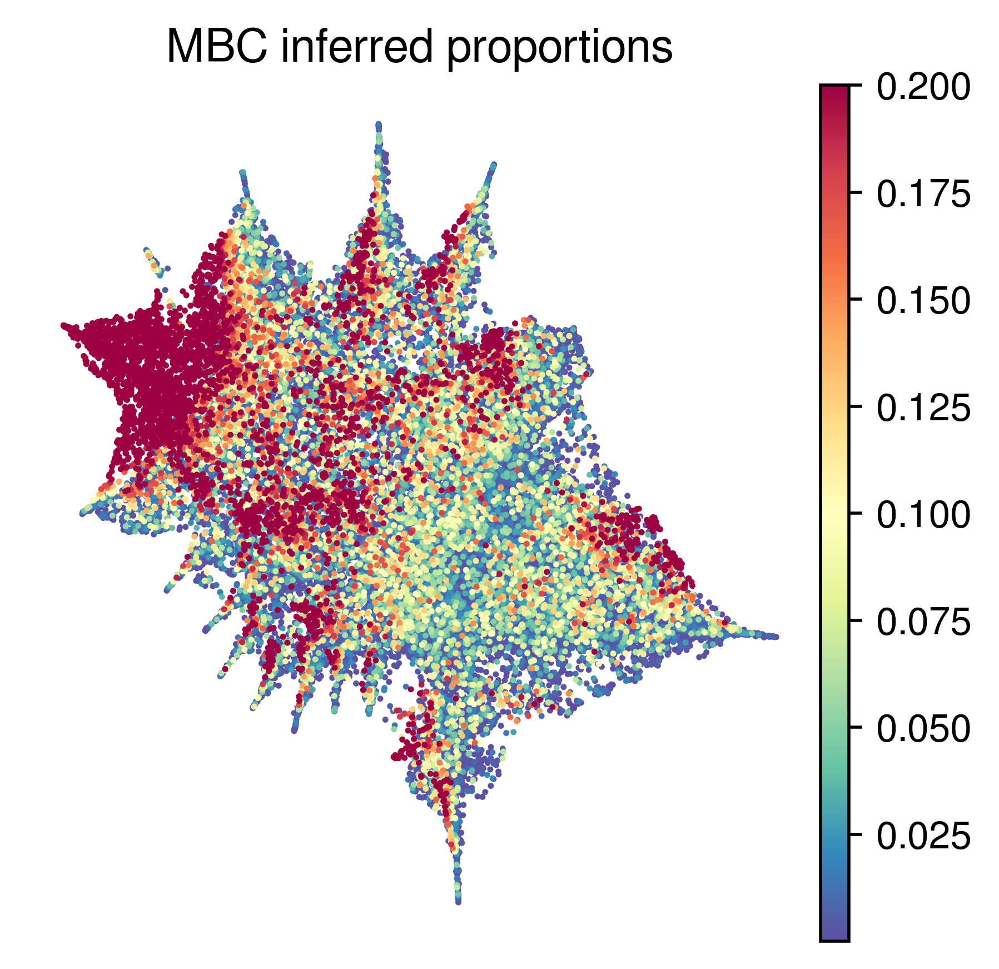

In [49]:
fig, ax = plt.subplots(1, 1,figsize=(4, 4), dpi=500)
sc.pl.umap(adata_integrate, color='MBC',  
           frameon=False, vmax=0.2,
           s=10, cmap='Spectral_r', ax=ax,
           title='MBC inferred proportions'
          )
plt.show()

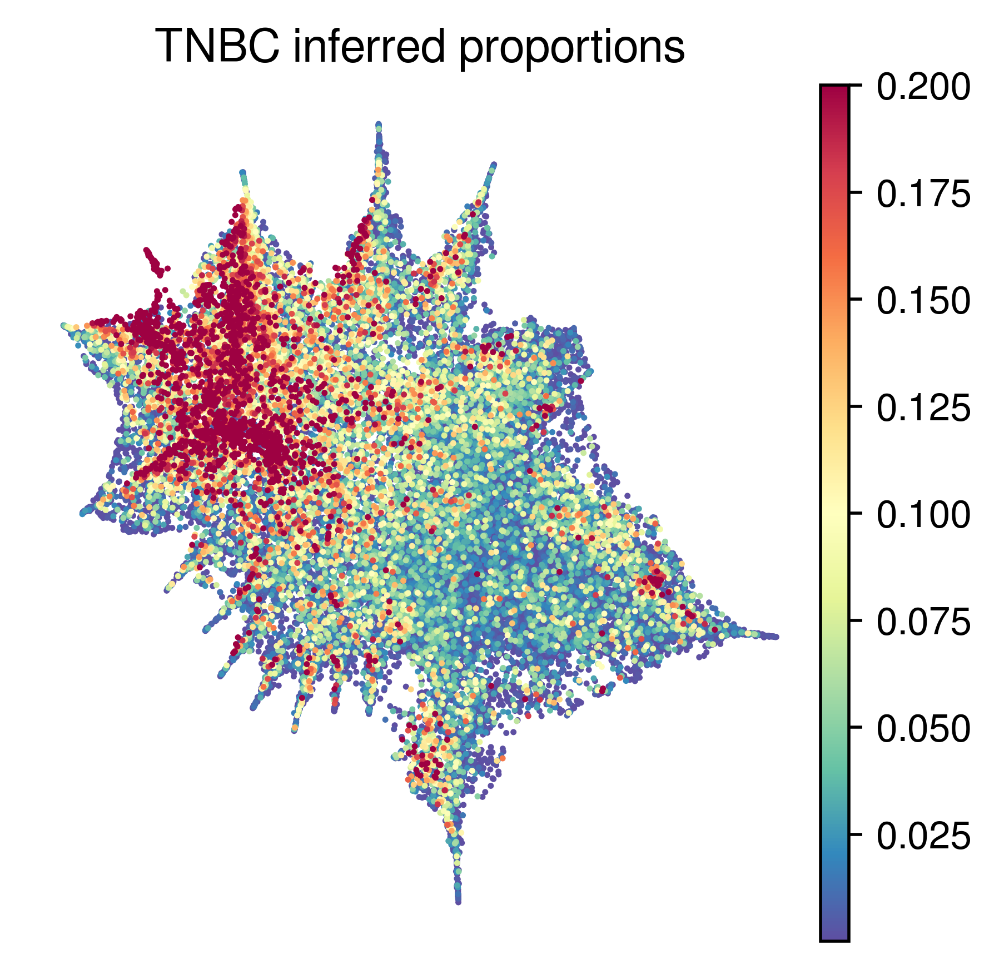

In [51]:
fig, ax = plt.subplots(1, 1,figsize=(4, 4), dpi=500)
sc.pl.umap(adata_integrate, color='Basal',  
           frameon=False, vmax=0.2,
           s=10, cmap='Spectral_r', ax=ax,
           title='TNBC inferred proportions'
          )
plt.show()

#### Spatial Hub calculation

In [ ]:
import scanpy.external as sce

adata_integrate.obsm['qz_m'] = np.array(inference_outputs['qz_m'].detach().cpu().numpy())
adata_integrate.obsm['qc_m'] = np.array(inference_outputs['qc_m'].detach().cpu().numpy())
adata_integrate.obsm['X_pca'] = adata_integrate.obsm['qc_m']

sc.pp.neighbors(adata_integrate)
sc.tl.leiden(adata_integrate)

# Calculate hubs via Phenograph clustering
sce.tl.phenograph(adata_integrate, clustering_algo="louvain")
adata_integrate.obs['hub'] = adata_integrate.obs['pheno_louvain'].astype('category')
adata_integrate.obs['hub']

Stay tuned for more examples of downstream analysis & visualizations

---